# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [78]:
# from google.colab import drive
# drive.mount('/content/drive')

# !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
# !unzip dataset.zip

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# START OF OUR CODE

### Imports

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
import math
from scipy.stats import pearsonr

### Study on denoising
Since we've noticed that SIFT performances in detecting are higly influenced by the quality of denoising, we decided to spent some time to understand how to reach a good denoising quality in the given scenes.
We've seen that among all the studied filters, the non-linear median filter and the bilateral one are those that lead to better results.
We want to get from filtering well denoised scenes but at the same time to preserve their features, avoiding an excessive smoothing. In order to achieve this result we've tryed some combinations of these two filters with different parameters. 
First the median filter is applyed to remove impulse noise, we made this decision since the bilateral filter doesn't handle very well this kind of noise. Then we apply the bilateral filter.

But what parameters should be used? In order to answer to this question we thought to do a rough study to understand which could be the best parameters for these two filters. We don't know if the noise distribution is the same for all images, moreover the number of pixels in each image is different (this could be deterministic in the performances of the median and bilateral filter, mainly for the parameters sigmaColor, d and the size of the mean filter) so we decided to find an average of the best parameter for each scene of the taskA.

In order to do this, we decided to denoise with parameters that make the scenes to look good (evaluation by naked eye), this has been done to help SIFT detecting at least one object for each scene. 

We need to detect one object for each scene since one of the parameters we decided to consider in the evaluation of the quality of denoising is the amount of keypoints/descriptors detected in the ROI of the perspective warped object detected in the denoised image and then how much of these matches with those of the model. This can tell us how good the keypoints detection and their description is, despite the smoothing due to the filters.

TODO
$ {KPs} = 20 \cdot \log_{10}\left(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}}\right) $

To evaluate denoising performances we also used PSNR, between the model pixel values and the ROI perspective warped of the object in the scene. PSNR is "the ratio between the maximum possible power of a signal and the power of corrupting noise that affects the fidelity of its representation" [Wikipedia](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio)

$ {PSNR} = 20 \cdot \log_{10}\left(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}}\right) $

The final function which function which combines will be the average of the two just showed.

In [2]:
def RGBimages_listing(dir_path, img_name, num):
    '''
    Function for extraction of RGB images from a specified directory,
    it returns a list of images.
    
    Arguments:
    - dir_path: str, path of the directory.
    - num: int, the first num images to extract.
    - img_name: str, name of the image. 
    '''
    imgs = []
    img_names = [f"{img_name}{i}.png" for i in range(1,num+1)]
    
    for img_name in img_names:
        img = cv2.imread(dir_path+img_name)
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imgs.append(rgb_img)
    return imgs

In [3]:
def median_bilateral(img, par1, par2, par3, par4):

    denoised_img = cv2.medianBlur(img, par1)
    denoised_img = cv2.medianBlur(denoised_img, par1)
    denoised_img = cv2.bilateralFilter(denoised_img, d=par2, sigmaColor=par3, sigmaSpace=par4)
    
    return denoised_img

In [10]:
def flann_knn_standard(model_des, scene_des):
    FLANN_INDEX_KDTREE = 1

    # Defining parameters for algorithm
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    
    # Defining search params.
    # checks=50 specifies the number of times the trees in the index should be recursively traversed.
    # Higher values gives better precision, but also takes more time
    search_params = dict(checks = 50)
    
    # Initializing matcher
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Matching and finding the 2 closest elements for each query descriptor.
    matches = flann.knnMatch(model_des,scene_des,k=2)
    return matches

def ambiguous_matches_filter(matches, threshold = 0.7):
    '''
    Filters out ambiguous matches.

    Arguments:
    - matches: list[(list[np.array],list[np.array])]: list of matched descriptors.
    - threshold: int, the threshold used for filtering. 
    '''
    good_matches = []
    for m, n in matches:
        if m.distance < threshold*n.distance:
            good_matches.append(m)
    return good_matches

def is_detected(num_kp, num_matches, threshold):
    MIN_MATCH_COUNT = math.ceil(num_kp*threshold)
    return num_matches > MIN_MATCH_COUNT

def get_homography(model_kp, scene_kp, matches):
    src_pts = np.float32([ model_kp[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ scene_kp[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,10.0)  
    return M

def draw_bounding_box(model, scene, M):
    
    # Handle both: grey scale and colored images
    if len(model.shape) == 3:
        h,w, _ = model.shape
    else: 
        h,w = model.shape
        
    model_corners = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    trans_corners = cv2.perspectiveTransform(model_corners,M)
    
    scene_with_bounding_box = cv2.polylines(scene.copy(),[np.int32(trans_corners)],True,(0, 255, 0),10, cv2.LINE_AA)
    
    # Height and Width of boundinx_box
    min_x = np.min(trans_corners[:, :, 0])
    max_x = np.max(trans_corners[:, :, 0])
    min_y = np.min(trans_corners[:, :, 1])
    max_y = np.max(trans_corners[:, :, 1])
    height = max_y - min_y
    width = max_x - min_x
    
    # Centroid
    centroid_position = centroid_of_polygon(trans_corners.reshape(-1, 2))
    cv2.circle(scene_with_bounding_box, tuple(map(int, centroid_position)), radius=5, color=(0,255,0), thickness=10)
    
    return scene_with_bounding_box, centroid_position, height, width

def centroid_of_polygon(corners):
    num_points = len(corners)
    x_sum = 0
    y_sum = 0

    for x, y in corners:
        x_sum += x
        y_sum += y

    centroid_x = x_sum / num_points
    centroid_y = y_sum / num_points
    
    return (round(float(centroid_x), 3), round(float(centroid_y), 3))

def get_ROI_perspective_warped(model, scene, M):
    roi = cv2.warpPerspective(scene, np.linalg.inv(M), (model.shape[1], model.shape[0]))
    return roi

def noise_mse(model, roi):
    return np.mean((model - roi)**2)

model1 = cv2.cvtColor(cv2.imread('dataset/models/ref1.png'), cv2.COLOR_BGR2RGB)
denoised_scene1 = cv2.cvtColor(cv2.imread('dataset/denoised_scenes/scene1.png'), cv2.COLOR_BGR2RGB)

model4 = cv2.cvtColor(cv2.imread('dataset/models/ref4.png'), cv2.COLOR_BGR2RGB)
denoised_scene2 = cv2.cvtColor(cv2.imread('dataset/denoised_scenes/scene2.png'), cv2.COLOR_BGR2RGB)

model8 = cv2.cvtColor(cv2.imread('dataset/models/ref8.png'), cv2.COLOR_BGR2RGB)
denoised_scene3 = cv2.cvtColor(cv2.imread('dataset/denoised_scenes/scene3.png'), cv2.COLOR_BGR2RGB)

model9 = cv2.cvtColor(cv2.imread('dataset/models/ref9.png'), cv2.COLOR_BGR2RGB)
denoised_scene4 = cv2.cvtColor(cv2.imread('dataset/denoised_scenes/scene4.png'), cv2.COLOR_BGR2RGB)

model11 = cv2.cvtColor(cv2.imread('dataset/models/ref11.png'), cv2.COLOR_BGR2RGB)
denoised_scene5 = cv2.cvtColor(cv2.imread('dataset/denoised_scenes/scene5.png'), cv2.COLOR_BGR2RGB)

sift = cv2.SIFT_create()

kp_model1, des_model1 = sift.detectAndCompute(model1, None)
kp_scene1, des_scene1 = sift.detectAndCompute(denoised_scene1, None)
kp_model4, des_model4 = sift.detectAndCompute(model4, None)
kp_scene2, des_scene2 = sift.detectAndCompute(denoised_scene2, None)
kp_model8, des_model8 = sift.detectAndCompute(model8, None)
kp_scene3, des_scene3 = sift.detectAndCompute(denoised_scene3, None)
kp_model9, des_model9 = sift.detectAndCompute(model9, None)
kp_scene4, des_scene4 = sift.detectAndCompute(denoised_scene4, None)
kp_model11, des_model11 = sift.detectAndCompute(model11, None)
kp_scene5, des_scene5 = sift.detectAndCompute(denoised_scene5, None)

matches1 = flann_knn_standard(des_model1, des_scene1)
matches1 = ambiguous_matches_filter(matches1)
matches2 = flann_knn_standard(des_model4, des_scene2)
matches2 = ambiguous_matches_filter(matches2)
matches3 = flann_knn_standard(des_model8, des_scene3)
matches3 = ambiguous_matches_filter(matches3)
matches4 = flann_knn_standard(des_model9, des_scene4)
matches4 = ambiguous_matches_filter(matches4)
matches5 = flann_knn_standard(des_model11, des_scene5)
matches5 = ambiguous_matches_filter(matches5)

if len(matches1) > 4 and is_detected(len(kp_model1), len(kp_scene1), 0.01):
    M1 = get_homography(kp_model1, kp_scene1, matches1)
    #plt.imshow(get_ROI_perspective_warped(model1, denoised_scene1, M1))
    #plt.show()
    
if len(matches2) > 4 and is_detected(len(kp_model4), len(kp_scene2), 0.01):
    M2 = get_homography(kp_model4, kp_scene2, matches2)
    #plt.imshow(get_ROI_perspective_warped(model4, denoised_scene2, M2))
    #plt.show()
    
if len(matches3) > 4 and is_detected(len(kp_model8), len(kp_scene3), 0.01):
    M3 = get_homography(kp_model8, kp_scene3, matches3)
    #plt.imshow(get_ROI_perspective_warped(model8, denoised_scene3, M3))
    #plt.show()
    
if len(matches4) > 4 and is_detected(len(kp_model9), len(kp_scene4), 0.01):
    M4 = get_homography(kp_model9, kp_scene4, matches4)
    #plt.imshow(get_ROI_perspective_warped(model9, denoised_scene4, M4))
    #plt.show()
    
if len(matches5) > 4 and is_detected(len(kp_model11), len(kp_scene5), 0.01):
    M5 = get_homography(kp_model11, kp_scene5, matches5)
    ##plt.imshow(get_ROI_perspective_warped(model11, denoised_scene5, M5))
    #plt.show()

In [4]:
def normalization(values):
    mean = np.mean(values)
    std = np.std(values)
    normalized_values = (values - mean) / std
    return normalized_values

In [12]:
# Evaluating Median Filter
nosiy_scene1 = cv2.cvtColor(cv2.imread('dataset/scenes/scene1.png'), cv2.COLOR_BGR2RGB)
nosiy_scene2 = cv2.cvtColor(cv2.imread('dataset/scenes/scene2.png'), cv2.COLOR_BGR2RGB)
nosiy_scene3 = cv2.cvtColor(cv2.imread('dataset/scenes/scene3.png'), cv2.COLOR_BGR2RGB)
nosiy_scene4 = cv2.cvtColor(cv2.imread('dataset/scenes/scene4.png'), cv2.COLOR_BGR2RGB)
nosiy_scene5 = cv2.cvtColor(cv2.imread('dataset/scenes/scene5.png'), cv2.COLOR_BGR2RGB)

noisy_scenes = [nosiy_scene1, nosiy_scene2, nosiy_scene3, nosiy_scene4, nosiy_scene5]
models = [model1, model4, model8, model9, model11]
Ms = [M1,M2,M3,M4,M5]

KeyboardInterrupt: 

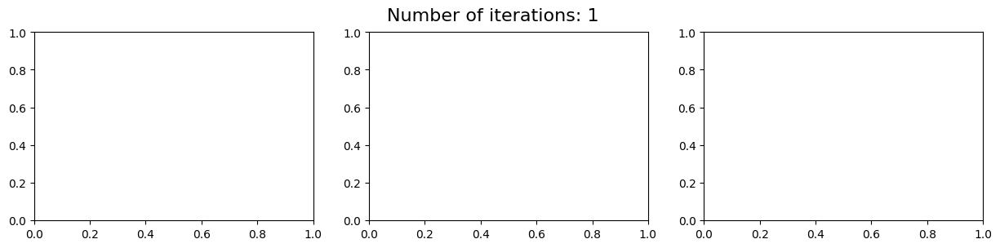

In [85]:
kernel = [3, 5, 7, 9, 11, 13, 15, 17]
iterations = [1, 3, 5, 7, 9, 11, 12, 13, 14, 15]
peaks_vals = []
colors = ['magenta', 'green', 'blue', 'purple', 'grey']
sift = cv2.SIFT_create()

for iter in iterations:
    ys_psnr = [] 
    ys_per = []
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    fig.suptitle(f'Number of iterations: {iter}', fontsize=16)
    for i, model in enumerate(models):
        kp_model, des_model = sift.detectAndCompute(model, None)
        results_median = []
        img = noisy_scenes[i]
        
        for val in kernel:
            for _ in range(iter):
                img = cv2.medianBlur(img, val)
                
            roi = get_ROI_perspective_warped(model, img, Ms[i])
            _, des_roi = sift.detectAndCompute(roi, None)
            matches = ambiguous_matches_filter(flann_knn_standard(des_model, des_roi))
            results_median.append((val, cv2.PSNR(model, roi), len(matches)*100/len(kp_model)))
            img = noisy_scenes[i]
            
        label = f'scene {i+1}'
        
        y_psnr = normalization([y for (_, y, _) in results_median])
        ys_psnr.append(y_psnr)
        
        y_per = normalization([y for (_, _, y) in results_median])
        ys_per.append(y_per)
        
        ax1.plot(kernel, y_psnr, label=label, color=colors[i], alpha=0.4)
        ax2.plot(kernel, y_per, label=label, color=colors[i], alpha=0.4)
        ax3.plot(kernel, [(x + y)*0.5 for x, y in zip(y_psnr, y_per)], label=label, color=colors[i], alpha=0.4)

    means_psnr = []
    means_per = []

    for i in range(len(kernel)): 
        sum_psnr = 0
        for y_psnr in ys_psnr:
            sum_psnr += y_psnr[i]
        means_psnr.append(sum_psnr/len(noisy_scenes))
        
    for i in range(len(kernel)):
        sum_per = 0 
        for y_per in ys_per:
            sum_per += y_per[i]
        means_per.append(sum_per/len(noisy_scenes))

    y_final = [(x + y)*0.5 for x, y in zip(means_psnr, means_per)]

    peak_idx_psnr = means_psnr.index(max(means_psnr))
    x_peak_psnr = kernel[peak_idx_psnr]
    y_peak_psnr = means_psnr[peak_idx_psnr]
    
    peak_idx_per = means_per.index(max(means_per))
    x_peak_per = kernel[peak_idx_per]
    y_peak_per = means_per[peak_idx_per]
    
    peak_idx_final = y_final.index(max(y_final))
    x_peak_final = kernel[peak_idx_final]
    y_peak_final = y_final[peak_idx_final]
    
    peaks_vals.append((y_peak_final, x_peak_final))
    
    ax1.plot(x_peak_psnr, y_peak_psnr, 'ro')
    ax1.text(x_peak_psnr, y_peak_psnr, f'{x_peak_psnr}', fontsize=12, verticalalignment='bottom')
    ax1.plot(kernel, means_psnr, color='red', label='mean', linewidth=2)
    ax1.legend()
    
    ax2.plot(x_peak_per, y_peak_per, 'ro')
    ax2.text(x_peak_per, y_peak_per, f'{x_peak_per}', fontsize=12, verticalalignment='bottom')
    ax2.plot(kernel, means_per, color='red', label='mean', linewidth=2)
    ax2.legend()
    
    ax3.plot(x_peak_final, y_peak_final, 'ro')
    ax3.text(x_peak_final, y_peak_final, f'{x_peak_final}', fontsize=12, verticalalignment='bottom')
    ax3.plot(kernel, y_final, color='red', label='mean', linewidth=2)
    ax3.legend()
    
    plt.show()

y_peaks = [y for (y, _) in peaks_vals]
plt.plot(iterations, [y for (y, _) in peaks_vals])
plt.title('Variation of function magnitude with different iterations of the Median filter')

for i, peak in enumerate(peaks_vals):
    plt.plot(iterations[i], peak[0], 'ro')
    plt.text(iterations[i], peak[0], f'{round(peak[1], 2)}', fontsize=10, verticalalignment='bottom')
plt.xlabel('Iterations')
plt.ylabel('Magnitude')
plt.show()

print('****************************************************************************************')
print('****************************************************************************************')
for i, iter in enumerate(iterations):   
    print(f'Iterations: {iter}  |  Kernel size: {peaks_vals[i][1]}  |  Magniute of function: {round(peaks_vals[i][0],3)}')
    print('----------------------------------------------------------------------------------------')    
print('****************************************************************************************')
print('****************************************************************************************')

In order to find a good approximation of the best parameters for the bilateral filter we've thought about a grid search considering some values. 

If want to run the code --> required to install jinja2 to visualize the data frame.

In [5]:
# We will use scenes filtered with the Median filter with kernel size of 3 and 15 iterations!
median_denoised_scenes = []
for scene in noisy_scenes:
    denoised = scene
    for _ in range(14):
        denoised = cv2.medianBlur(denoised, 3)        
    median_denoised_scenes.append(denoised)

NameError: name 'noisy_scenes' is not defined

In [ ]:
import itertools
import pandas as pd

def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: #006400' if v else '' for v in is_max]

param_grid = {
    'd' : list(range(20, 70, 10)),
    'sigmaColor' : list(range(20, 35, 5)),
    'sigmaSpace' : list(range(15, 30, 5)),
    'iterations' : [2, 3, 4, 5]
}

param_names = list(param_grid.keys())
combinations = list(itertools.product(*param_grid.values()))

kp_des_models = []
results = {key: {'PSNR': [], 'Percentage': []} for key in combinations}
    
for i, model in enumerate(models):
    kp_model, des_model = sift.detectAndCompute(model, None)
    
    psnrs = []
    pers = []
    for combination in combinations:
        params = dict(zip(param_names, combination))
        scene = median_denoised_scenes[i]
        for _ in range(params['iterations']):
            scene = cv2.bilateralFilter(scene, params['d'], params['sigmaColor'], params['sigmaSpace'])
        roi = get_ROI_perspective_warped(model, scene, Ms[i])
        _, des_roi = sift.detectAndCompute(roi, None)
        matches = ambiguous_matches_filter(flann_knn_standard(des_model, des_roi))
        psnrs.append(cv2.PSNR(model, roi))
        pers.append(len(matches)*100/len(kp_model))
    
    psnrs = normalization(psnrs)
    pers = normalization(pers)
    
    for i, combination in enumerate(combinations):
        results[combination]['PSNR'].append(psnrs[i])
        results[combination]['Percentage'].append(pers[i])

flattened_result = []
# Average on every model result for each combination + flattening into a list
for i, key in enumerate(results.keys()):
    psnr_mean = np.mean(results[key]['PSNR'])
    per_mean = np.mean(results[key]['Percentage'])
    psnr_per_mean = np.mean(psnr_mean+per_mean)
    flattened_result.append([combinations[i][0], combinations[i][1], combinations[i][2], combinations[i][3], psnr_mean, per_mean, psnr_per_mean])

# Print results as Data Frame
df = pd.DataFrame(flattened_result, columns = param_names + ['PSNR'] + ['Percentage'] + ['PSNR + Matched kp (%)'])
styled_df = df.style.apply(highlight_max, subset=['PSNR', 'Percentage', 'PSNR + Matched kp (%)'])
styled_df

,d,sigmaColor,sigmaSpace,iterations,PSNR,Percentage,PSNR + Matched kp (%)
0,20,20,15,2,-1.894902,0.027838,-1.867063
1,20,20,15,3,-0.788186,-0.095551,-0.883737
2,20,20,15,4,-0.326136,-0.261720,-0.587856
3,20,20,15,5,-0.191927,-0.345826,-0.537753
4,20,20,20,2,-1.836707,0.010715,-1.825991
5,20,20,20,3,-0.732345,0.181005,-0.551339
6,20,20,20,4,-0.281184,-0.184238,-0.465422
7,20,20,20,5,-0.158477,-0.276496,-0.434973
8,20,20,25,2,-1.809656,0.211312,-1.598344
9,20,20,25,3,-0.706526,-0.042203,-0.748728


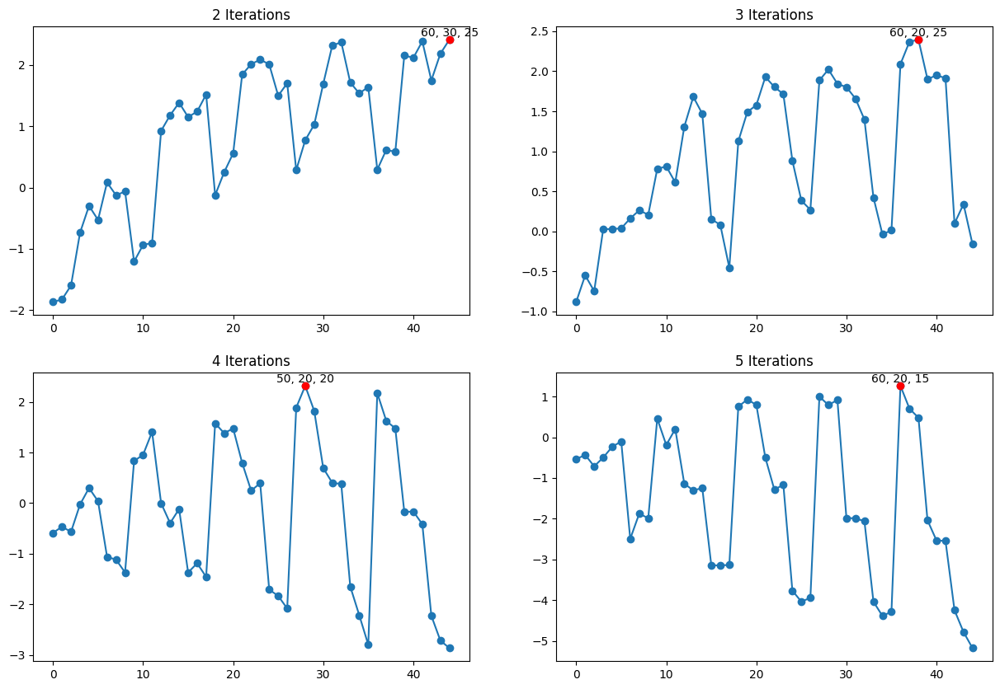

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

for i, ax in enumerate(axs.ravel()):
    
    sub_df = df[df['iterations'] == i+2]
    sub_df = sub_df.reset_index(drop=True)
    ax.plot(list(range(len(sub_df))), sub_df['PSNR + Matched kp (%)'], marker = 'o', linestyle='-')
    max_row = sub_df[sub_df['PSNR + Matched kp (%)'] == max(sub_df['PSNR + Matched kp (%)'])]
    idx = sub_df.index[sub_df['PSNR + Matched kp (%)'] == max(sub_df['PSNR + Matched kp (%)'])][0]
    ax.plot(idx, max(sub_df['PSNR + Matched kp (%)']), 'ro')
    ax.annotate(f'{max_row['d'].tolist()[0]}, {max_row['sigmaColor'].tolist()[0]}, {max_row['sigmaSpace'].tolist()[0]}', 
                xy = (idx, max(sub_df['PSNR + Matched kp (%)'])), 
                textcoords="offset points", 
                ha='center', 
                xytext=(0, 3))
    ax.set_title(f'{i+2} Iterations')

plt.show()

In [ ]:
def DeNoise(dir, newdir, num, img_name, print):
    '''
    A preprocessing function to repair the noisy scenes!

    Arguments:
    - dir: str, the original directory containing the noisy images.
    - newdir: str, the directory where denoised images will be saved.
    - num: int, the number of images to process.
    '''
    # Create the new directory
    if not os.path.exists(newdir):
        os.mkdir(newdir)

    # Iterate through the image names
    img_names = [f"{img_name}{i}.png" for i in range(1,num+1)]
    for img_name in img_names:
        # Read the image
        img = cv2.imread(dir+img_name)
        # Convert image to RGB
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Remove impulse noise using a median filter
        removed_impulse_img = rgb_img
        for _ in range(15):
            removed_impulse_img = cv2.medianBlur(removed_impulse_img, 3)
        
        # Remove Gaussian noise without smoothing using a bilater filter
        filtere_img = removed_impulse_img
        for _ in range(2):
            filtered_img = cv2.bilateralFilter(filtere_img, d=60, sigmaColor=30, sigmaSpace=25)
       
        # Convert image to BGR to write it
        filtered_img_bgr = cv2.cvtColor(filtered_img, cv2.COLOR_RGB2BGR) 
        cv2.imwrite(newdir+img_name, filtered_img_bgr)

        if print:
            # Plotting
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))

            # Plot the original noisy image
            axes[0].imshow(rgb_img)
            axes[0].set_title('Original Image')
            axes[0].axis('off')

            # Plot the filtered denoised image
            axes[1].imshow(filtered_img)
            axes[1].set_title('Denoised Image')
            axes[1].axis('off')

            plt.show()

DeNoise(dir='dataset/scenes/', newdir='dataset/denoised_scenes/', num=5, img_name='scene', print=False)

## Task A solution

The solution we found follows these steps:
1. Scenes filtering in order to remove the noise. The used filters are:
    - Median filter for impulse noise.
    - Bilateral filter for Gaussian noise without blurring.
2. Apply for each model on each scene the SIFT algorithm to find the object in the scene.
3. Transform the perspective of the scene image extracting the ROI with the same shape of the model.
4. Apply template matching algorithm in order to filter out wrong SIFT detections.

    

### Add here filtering on scenes part 


### Detection with SIFT
In order to detect object using SIFT feature matching algorithm, the following steps have been implemented:
1. keypoints and descriptors computation of each model and scene;
2. with the help of FLANN implementation of KNN Matching algorithm, the computation of the descriptors matches;
3. filtering out ambiguous matches;
4. filtering out valid detections using a threshold of the minimum number of not ambiguous descriptors matches;
5. bounding box drawing to plot the scene.

#### *keypoints_descriptors_SIFT()*
The function *keypoints_descriptors_SIFT*, given a list of images, returns the lists of keypoints and descriptors computed with SIFT and sorted in the same index position of the input list. 

In [6]:
def keypoints_descriptors_SIFT(imgs):
    sift = cv2.SIFT_create()
    
    imgs_kp = []
    imgs_des = []
    
    if len(imgs) > 0:
        imgs_kp = [sift.detectAndCompute(img, None)[0] for img in imgs]
        imgs_des = [sift.detectAndCompute(img, None)[1] for img in imgs]
    
    return imgs_kp, imgs_des

#### *flann_knn_standard()*
The function *flann_knn_standard*, given the list of models: *model_des* and of scenes: *scene_des*, it returns the found matches using the FLANN implementation of the KNN Match alghoritm. The first 2 closest descriptors are found for each model keypoint. 

In [7]:
def flann_knn_standard(model_des, scene_des):
    FLANN_INDEX_KDTREE = 1

    # Defining parameters for algorithm
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    
    # Defining search params.
    # checks=50 specifies the number of times the trees in the index should be recursively traversed.
    # Higher values gives better precision, but also takes more time
    search_params = dict(checks = 50)
    
    # Initializing matcher
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Matching and finding the 2 closest elements for each query descriptor.
    matches = flann.knnMatch(model_des,scene_des,k=2)
    return matches

#### *ambiguous_matches_filter()*
The function *ambiguous_matches_filter*, given the list of tuple *matches* and *threshold* (default value 0.7), it returns only the not ambiguous matches. 

In [8]:
def ambiguous_matches_filter(matches, threshold = 0.7):
    '''
    Filters out ambiguous matches.

    Arguments:
    - matches: list[(list[np.array],list[np.array])]: list of matched descriptors.
    - threshold: int, the threshold used for filtering. 
    '''
    good_matches = []
    for m, n in matches:
        if m.distance < threshold*n.distance:
            good_matches.append(m)
    return good_matches

#### *is_detected()*
The function *is_detected*, given the number of keypoints of the model: *num_kp*, the number of matches found *num_matches* and a threshold value: *threshold* determine whether the not ambiguous matches are enough to consider the object detected or not. The threshold must be specified as a decimal percentage and represents the minimum number of keypoints in the model required to consider an object as detected. It returns *True* if the matches are enough, otherwise returns *False*.  
  
The decision of considering the percentage of the model keypoints number as the minimum number of matches is due to the different number of keypoints in each model. Doing so the *MIN_MATCH_COUNT* constant will be related to every single model.

In [9]:
def is_detected(num_kp, num_matches, threshold):
    MIN_MATCH_COUNT = math.ceil(num_kp*threshold)
    return num_matches > MIN_MATCH_COUNT

#### *get_homography()*
The function *get_homography*, given the model keypoints *model_kp*, *scene_kp* and the valid matches list *matches*, compute e returns the homography matrix *M*: 

In [10]:
def get_homography(model_kp, scene_kp, matches):
    src_pts = np.float32([ model_kp[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ scene_kp[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,10.0)  
    return M

#### *draw_bounding_box()*
The function *draw_bounding_box*, given the model image *model*, the scene image *scene* and the homography matrix *M*, returns the scene with the bounding box highlighting the detected object. It also computes the centroid position of the bounding box, it draws and returns it. The same with the max height and width of the bounding box.   

In [11]:
def centroid_of_polygon(corners):
    num_points = len(corners)
    x_sum = 0
    y_sum = 0

    for x, y in corners:
        x_sum += x
        y_sum += y

    centroid_x = x_sum / num_points
    centroid_y = y_sum / num_points
    
    return (round(float(centroid_x), 3), round(float(centroid_y), 3))

In [12]:
def draw_bounding_box(model, scene, M):
    
    # Handle both: grey scale and colored images
    if len(model.shape) == 3:
        h,w, _ = model.shape
    else: 
        h,w = model.shape
        
    model_corners = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    trans_corners = cv2.perspectiveTransform(model_corners,M)
    
    scene_with_bounding_box = cv2.polylines(scene.copy(),[np.int32(trans_corners)],True,(0, 255, 0),10, cv2.LINE_AA)
    
    # Height and Width of boundinx_box
    min_x = np.min(trans_corners[:, :, 0])
    max_x = np.max(trans_corners[:, :, 0])
    min_y = np.min(trans_corners[:, :, 1])
    max_y = np.max(trans_corners[:, :, 1])
    height = max_y - min_y
    width = max_x - min_x
    
    # Centroid
    centroid_position = centroid_of_polygon(trans_corners.reshape(-1, 2))
    cv2.circle(scene_with_bounding_box, tuple(map(int, centroid_position)), radius=5, color=(0,255,0), thickness=10)
    
    return scene_with_bounding_box, centroid_position, height, width

#### *get_ROI_perspective_warped()*
The function *get_ROI_perspective_warped*, given the model image *model*, the scene image *scene* and the homography matrix *M*, it returns the ROI from the scene with the perspective warped. 

In [13]:
def get_ROI_perspective_warped(model, scene, M):
    roi = cv2.warpPerspective(scene, np.linalg.inv(M), (model.shape[1], model.shape[0]))
    return roi

#### *object_detection_SIFT()*
The function *object_detection_SIFT*, given the model image *model*, the scene image *scene* and threshold *threshold*, plot the scene with the bounding box highlighted and returns the image if the object is found in the scene, otherwise in returns *None*. 

In [14]:
def object_detection_SIFT(model, scene, threshold):
    
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    # If less than 4 matches, not possible to compute mapping 
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), threshold):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        
        roi = get_ROI_perspective_warped(model, scene, M)
        plt.imshow(roi)
        plt.title('ROI with perspective warped from scene')
        plt.show()
        
        plt.imshow(boundingbox_scene)
        plt.title('Detected object in the scene')
        plt.show()
        
        print('##################################################################################')
        print('Position of the detected object in the scene: ', centroid_position)
        print('Height of bounding box: ', height)
        print('Width of bounding box: ', width)
        print('##################################################################################')
        return boundingbox_scene
    else:
        print('The model hasn\'t been detected in the scene')
        return None

#### Example of **correct detection** with object_detection_SIFT() 

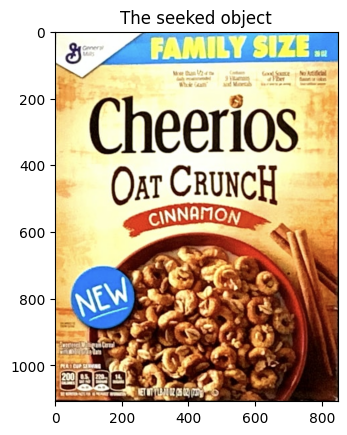

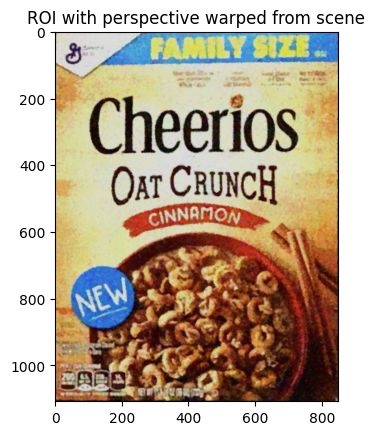

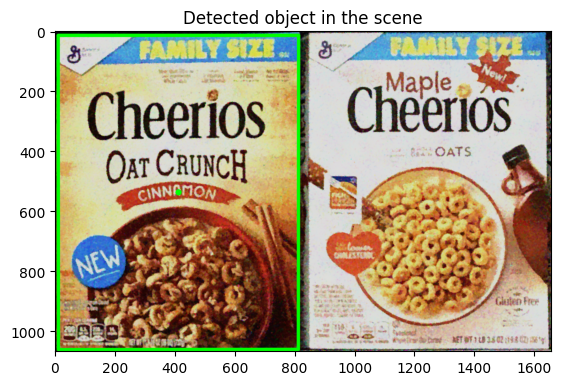

##################################################################################
Position of the detected object in the scene:  (412.075, 538.705)
Height of bounding box:  1049.2102
Width of bounding box:  802.96234
##################################################################################


In [19]:
model = cv2.imread('dataset/models/ref1.png') 
scene = cv2.imread('dataset/denoised_scenes/scene1.png') 

model = cv2.cvtColor(model, cv2.COLOR_BGR2RGB)
scene = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

plt.imshow(model)
plt.title('The seeked object')
plt.show()

_ = object_detection_SIFT(model, scene, 0.03)

#### Example of **wrong detection** with object_detection_SIFT()

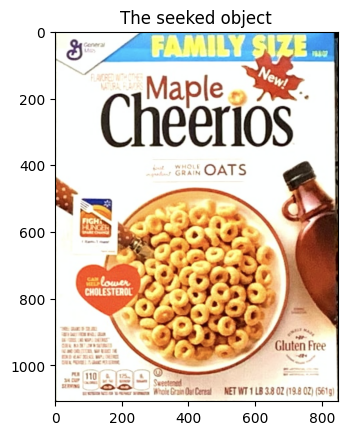

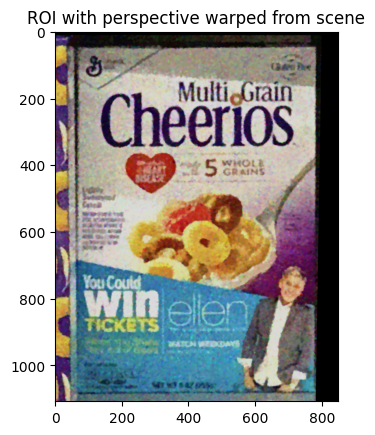

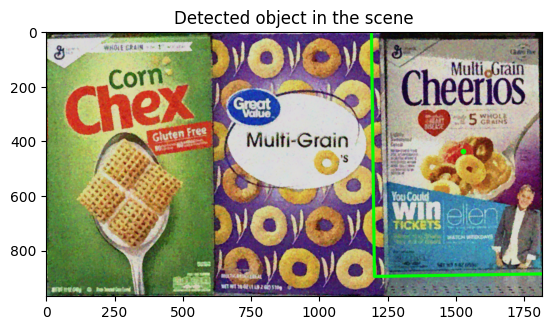

##################################################################################
Position of the detected object in the scene:  (1528.331, 440.698)
Height of bounding box:  906.91705
Width of bounding box:  676.0006
##################################################################################


In [18]:
model = cv2.imread('dataset/models/ref2.png')
scene = cv2.imread('dataset/denoised_scenes/scene2.png')

model = cv2.cvtColor(model, cv2.COLOR_BGR2RGB)
scene = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

plt.imshow(model)
plt.title('The seeked object')
plt.show()

_ = object_detection_SIFT(model, scene, 0.01)

To avoid this wrong detection would be sufficient to increase the threshold (that was 0.01). On the other hand, increasing the threshold would make SIFT missing some correct detections. To avoid this, we thought to keep low the threshold (keep it 0.01), then doublecheck the SIFT detections using a template matching algorithm. Since template matching is not scaling and rotation invariant, we decided to compare the model with the ROI with its perspective warped to be of the same size and perspective of the model. As similarity function we used the ZNCC in order to handle affinity intensity changes. Then we consider only detections with a high coefficient of similarity.
On the other hand template matching cannot handle partially occluded object, in order to manage this cases we decided to split both the model and ROI in a grid of patches n x n and comparing corresponding patches. We consider detected an object if and only if more than half of the patches return a high coefficient of similarity.

#### SIFT_templatematching_detection()

In [15]:
def divide_image_into_patches(image, n):
    """
    Divides an image into a grid of n x n patches. If the image is not divisible by n,
    the patches on the rightmost and bottom edges will be larger to cover the remaining pixels.
    
    Parameters:
        image (numpy.ndarray): The input image.
        n (int): The number of divisions along each axis.
    
    Returns:
        list: A list of patches (as numpy arrays).
    """
    h, w = image.shape[:2]
    patch_w = w // n
    patch_h = h // n
    
    patches = []
    
    for i in range(n):
        from_h = i * patch_h
        to_h = h if i == n - 1 else (i + 1) * patch_h  # Last patch covers the remaining height
        for j in range(n):
            from_w = j * patch_w
            to_w = w if j == n - 1 else (j + 1) * patch_w  # Last patch covers the remaining width
            patch = image[from_h:to_h, from_w:to_w]
            patches.append(patch)
    
    return patches
def all_pixels_same(patch):
    # Convert patch to grayscale if it's not already
    if len(patch.shape) == 3:
        patch = cv2.cvtColor(patch, cv2.COLOR_BGR2GRAY)
    
    # Check if all pixels have the same value
    return np.all(patch == patch[0, 0])
def SIFT_templatematching_both_total_and_occluded(model, scene, sift_th, tmpl_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        # Checking with templateMatching() the ROI with the model
        roi = get_ROI_perspective_warped(model, scene, M)
        matching_coeff = cv2.matchTemplate(model, roi, cv2.TM_CCOEFF_NORMED)[0][0]
        print("Matching_coeff: ", matching_coeff)
        if matching_coeff > tmpl_th:
            print("Found immediately!")
            return (boundingbox_scene, centroid_position, height, width)
        # Handle cases when the object is partially occluded (at least 1/8 of the image must match its correspective part in the model)
        else:
            w = model.shape[0]
            h = model.shape[1]
            patch_w = int(w/8)
            patch_h = int(h/8)
            from_w = 0
            from_h = 0
            to_w = 0
            to_h = 0
            valid_patch = 0
            for from_w in range(0, w, patch_w):
                to_w = min(from_w + patch_w, w)
                for from_h in range(0, h, patch_h):
                    to_h = min(from_h + patch_h, h)
                    model_patch = model[from_w:to_w, from_h:to_h]
                    roi_patch = roi[from_w:to_w, from_h:to_h]
                    # Handle the case when the patch is black (? maybe)
                    if all_pixels_same(roi_patch) or all_pixels_same(model_patch):
                        continue
                    coeff = cv2.matchTemplate(model_patch, roi_patch, cv2.TM_CCOEFF_NORMED)[0][0]
                    if coeff > tmpl_th:
                        valid_patch += 1
            if valid_patch >= 8:
                print(f"Detected as occluded object with {valid_patch} patches matched!") 
                return (boundingbox_scene, centroid_position, height, width) 
    return None
def SIFT_templatematching_occluded(model, scene, sift_th, tmpl_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        roi = get_ROI_perspective_warped(model, scene, M)
        # Handle cases when the object is partially occluded (at least 1/8 of the image must match its correspective part in the model)
        w = model.shape[0]
        h = model.shape[1]
        patch_w = int(w/8)
        patch_h = int(h/8)
        from_w = 0
        from_h = 0
        to_w = 0
        to_h = 0
        valid_patch = 0
        i = 0
        for from_w in range(0, w, patch_w):
            to_w = min(from_w + patch_w, w)
            for from_h in range(0, h, patch_h):
                to_h = min(from_h + patch_h, h)
                model_patch = model[from_w:to_w, from_h:to_h]
                roi_patch = roi[from_w:to_w, from_h:to_h]
                # Handle the case when the patch is black (? maybe)
                if all_pixels_same(roi_patch) or all_pixels_same(model_patch):
                    continue
                coeff = cv2.matchTemplate(model_patch, roi_patch, cv2.TM_CCOEFF_NORMED)[0][0]
                print(f"The patch num {i} has a matchin coeff of: {coeff}")
                if coeff > tmpl_th:
                    valid_patch += 1
                i += 1
        if valid_patch >= 10:
            print(f"Detected as occluded object with {valid_patch} patches matched!") 
            return (boundingbox_scene, centroid_position, height, width) 
    return None
def SIFT_templatematching(model, scene, sift_th, tmpl_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        # Checking with templateMatching() the ROI with the model
        roi = get_ROI_perspective_warped(model, scene, M)
        matching_coeff = cv2.matchTemplate(model, roi, cv2.TM_CCOEFF_NORMED)[0][0]
        print(f"Matched kpts: {len(filtered_matches)*100/len(model_kp)} | Matching_coeff: {matching_coeff}")
        if matching_coeff >= tmpl_th:
            return (boundingbox_scene, centroid_position, height, width)      
def SIFT_templatematching_canny(model, scene, sift_th, tmpl_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        # Checking with templateMatching() the ROI with the model
        roi = get_ROI_perspective_warped(model, scene, M)
        matching_coeff = cv2.matchTemplate(cv2.Canny(model, threshold1=150, threshold2=200), cv2.Canny(roi, threshold1=150, threshold2=200), cv2.TM_CCOEFF_NORMED)[0][0]
        print(f"Matched kpts: {len(filtered_matches)*100/len(model_kp)} | Matching_coeff: {matching_coeff}")
        if matching_coeff >= tmpl_th:
            return (boundingbox_scene, centroid_position, height, width)   
def SIFT_templatematching_occluded_canny(model, scene, sift_th, tmpl_th, n, patch_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        # Checking with templateMatching() the ROI with the model
        roi = get_ROI_perspective_warped(model, scene, M)
        #matching_coeff = cv2.matchTemplate(cv2.Canny(model, threshold1=150, threshold2=200), cv2.Canny(roi, threshold1=150, threshold2=200), cv2.TM_CCOEFF_NORMED)[0][0]
        matching_coeff = cv2.matchTemplate(model, roi, cv2.TM_CCOEFF_NORMED)[0][0]
        # Handle cases when the object is partially occluded (at least 1/8 of the image must match its correspective part in the model)
        model_patches = divide_image_into_patches(model, n)
        roi_patches = divide_image_into_patches(roi, n)
        valid_patches = 0
        valid_patches_matching_avg_coeff = 0
        i = 0
        for i, patch in enumerate(model_patches):  
            #coeff = cv2.matchTemplate(cv2.Canny(patch, threshold1=150, threshold2=200), cv2.Canny(roi_patches[i], threshold1=150, threshold2=200), cv2.TM_CCOEFF_NORMED)[0][0]
            coeff = cv2.matchTemplate(patch, roi_patches[i], cv2.TM_CCOEFF_NORMED)[0][0]
            if coeff > tmpl_th:
                valid_patches += 1
                valid_patches_matching_avg_coeff += coeff
                i += 1
        if valid_patches >= patch_th:
            print(f"Matched kpts: {round(len(filtered_matches)*100/len(model_kp), 2)} | Matching_coeff: {round(matching_coeff, 2)} | Valid Patches: {valid_patches} with avg: {valid_patches_matching_avg_coeff/i}")
            return (boundingbox_scene, centroid_position, height, width) 
        else:
            return None
def SIFT(model, scene, sift_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        print(f"The number of matched kpts: {len(filtered_matches)*100/len(model_kp)}%")
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        return (boundingbox_scene, centroid_position, height, width)  
    return None

In [16]:
def SIFT_crossmatching(model, scene, sift_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        perc = (len(filtered_matches)/len(model_kp))*100
        print(f'Percentage: {perc}')
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        # Checking with templateMatching() the ROI with the model
        roi = get_ROI_perspective_warped(model, scene, M)
        if crossmatching(roi, model, sift_th):
            return boundingbox_scene, centroid_position, height, width
        else: 
            print('Crossmatching NOT PASSED!!!!!')
        
def crossmatching(roi, model, sift_th):
    sift = cv2.SIFT_create()
    roi_kp, roi_des = sift.detectAndCompute(roi, None)
    _, model_des = sift.detectAndCompute(model, None)
    matches = flann_knn_standard(roi_des, model_des)
    filtered_matches = ambiguous_matches_filter(matches)
    if len(filtered_matches) > 4 and is_detected(len(roi_kp), len(filtered_matches), sift_th):
        return True   
    return False

#### Color_check()

Given two images this function computes 3 histograms for each image (one for each channel) and then it compares them using cosine similraity.

In [17]:
#from scipy.spatial.distance import cosine

def color_check(img1, img2):
    img1 = cv2.cvtColor(img1, cv2.COLOR_RGB2HSV)
    img2 = cv2.cvtColor(img2, cv2.COLOR_RGB2HSV)
    hist1_H = cv2.calcHist(img1[:, :, 0], [0], None, [256], [0, 256])
    hist2_H = cv2.calcHist(img2[:, :, 0], [0], None, [256], [0, 256])
    hist1_V = cv2.calcHist(img1[:, :, 1], [0], None, [256], [0, 256])
    hist2_V = cv2.calcHist(img2[:, :, 1], [0], None, [256], [0, 256])
    similarity_H = cv2.compareHist(hist1_H, hist2_H, cv2.HISTCMP_CORREL)
    similarity_V = cv2.compareHist(hist1_V, hist2_V, cv2.HISTCMP_CORREL)
    return (similarity_H + similarity_V)/2 

def color_check_plot(img1, img2):
    # Convert images from RGB to HSV color space
    img1_hsv = cv2.cvtColor(img1, cv2.COLOR_RGB2HSV)
    img2_hsv = cv2.cvtColor(img2, cv2.COLOR_RGB2HSV)
    
    # Calculate histograms for Hue, Saturation, and Value channels
    hist1_H = cv2.calcHist([img1_hsv], [0], None, [256], [0, 256])
    hist2_H = cv2.calcHist([img2_hsv], [0], None, [256], [0, 256])
    
    hist1_S = cv2.calcHist([img1_hsv], [1], None, [256], [0, 256])
    hist2_S = cv2.calcHist([img2_hsv], [1], None, [256], [0, 256])
    
    hist1_V = cv2.calcHist([img1_hsv], [2], None, [256], [0, 256])
    hist2_V = cv2.calcHist([img2_hsv], [2], None, [256], [0, 256])
    
    # Compare histograms for similarity
    similarity_H = cv2.compareHist(hist1_H, hist2_H, cv2.HISTCMP_CORREL)
    similarity_S = cv2.compareHist(hist1_S, hist2_S, cv2.HISTCMP_CORREL)
    similarity_V = cv2.compareHist(hist1_V, hist2_V, cv2.HISTCMP_CORREL)
    
    # Plot histograms for each channel
    plt.figure(figsize=(15, 5))

    # Plot Hue histograms
    plt.subplot(1, 3, 1)
    plt.title('Hue Histograms')
    plt.plot(hist1_H, color='r', label='Image 1')
    plt.plot(hist2_H, color='b', label='Image 2')
    plt.xlim([0, 256])
    plt.legend()
    
    # Plot Saturation histograms
    plt.subplot(1, 3, 2)
    plt.title('Saturation Histograms')
    plt.plot(hist1_S, color='r', label='Image 1')
    plt.plot(hist2_S, color='b', label='Image 2')
    plt.xlim([0, 256])
    plt.legend()

    # Plot Value histograms
    plt.subplot(1, 3, 3)
    plt.title('Value Histograms')
    plt.plot(hist1_V, color='r', label='Image 1')
    plt.plot(hist2_V, color='b', label='Image 2')
    plt.xlim([0, 256])
    plt.legend()

    plt.tight_layout()
    plt.show()

    return similarity_H


In [18]:
def SIFT_templatematching_detection_occluded_color(model, scene, sift_th, tmpl_th, color_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        # Checking with templateMatching() the ROI with the model
        roi = get_ROI_perspective_warped(model, scene, M)
        matching_coeff = cv2.matchTemplate(model, roi, cv2.TM_CCOEFF_NORMED)[0][0]
        if matching_coeff > tmpl_th:
            print('The color similarity is: ', color_check(model, roi))
            return (boundingbox_scene, centroid_position, height, width)
        # Handle cases when the object is partially occluded (at least 1/8 of the image must match its correspective part in the model)
        else:
            w = model.shape[0]
            h = model.shape[1]
            patch_w = int(w/8)
            patch_h = int(h/8)
            from_w = 0
            from_h = 0
            to_w = 0
            to_h = 0
            valid_patch = 0
            for from_w in range(0, w, patch_w):
                to_w = min(from_w + patch_w, w)
                for from_h in range(0, h, patch_h):
                    to_h = min(from_h + patch_h, h)
                    model_patch = model[from_w:to_w, from_h:to_h]
                    roi_patch = roi[from_w:to_w, from_h:to_h]
                    # Handle the case when the patch is black (? maybe)
                    if all_pixels_same(roi_patch) or all_pixels_same(model_patch):
                        continue
                    coeff = cv2.matchTemplate(model_patch, roi_patch, cv2.TM_CCOEFF_NORMED)[0][0]
                    color_similarity = color_check(model_patch, roi_patch)
                    if coeff > tmpl_th and color_similarity > color_th:
                        valid_patch += 1
            if valid_patch >= 8:
                print(f"Detected as occluded object with {valid_patch} patches matched!") 
                return (boundingbox_scene, centroid_position, height, width) 
    return None

In [24]:
def SIFT_templatematching_allcriterias(model, scene, sift_th, tmpl_th, color_th):
    sift = cv2.SIFT_create()
    model_kp, model_des = sift.detectAndCompute(model, None)
    scene_kp, scene_des = sift.detectAndCompute(scene, None)
    matches = flann_knn_standard(model_des, scene_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    if len(filtered_matches) > 4 and is_detected(len(model_kp), len(filtered_matches), sift_th):
        M = get_homography(model_kp, scene_kp, filtered_matches)
        boundingbox_scene, centroid_position, height, width = draw_bounding_box(model, scene, M)
        # Checking with templateMatching() the ROI with the model
        roi = get_ROI_perspective_warped(model, scene, M)
        plt.imshow(roi)
        plt.show()
        matching_coeff = cv2.matchTemplate(model, roi, cv2.TM_CCOEFF_NORMED)[0][0]
        # Handle cases when the object is partially occluded (at least 1/8 of the image must match its correspective part in the model)
        valid_patches = occlusion_check(model, roi, 64, tmpl_th, color_th)
        if matching_coeff > tmpl_th:
            return (boundingbox_scene, centroid_position, height, width)
        elif valid_patches > 8:
            print(f"Detected as occluded object with {valid_patches} patches matched!")
            return (boundingbox_scene, centroid_position, height, width)
    
    return None

def occlusion_check(model, roi, patches_number, tmpl_th, color_th):
    # Checking if the number of patches is feasibile in a rectangle
    if math.sqrt(patches_number) != int(math.sqrt(patches_number)):
        print('Number of patches not valid!')
        return 0
    # Splitting the image in 64 patches
    w = model.shape[0]
    h = model.shape[1]
    patch_w = int(w/8)
    patch_h = int(h/8)
    from_w = 0 
    from_h = 0 
    to_w = 0 
    to_h = 0
    valid_patches = 0
    for from_w in range(0, w, patch_w):
        to_w = min(from_w + patch_w, w)
        for from_h in range(0, h, patch_h):
            to_h = min(from_h + patch_h, h)
            model_patch = model[from_w:to_w, from_h:to_h]
            roi_patch = roi[from_w:to_w, from_h:to_h]
            # Handle the case when the patch is black
            if all_pixels_same(roi_patch) or all_pixels_same(model_patch):
                continue
            coeff = cv2.matchTemplate(model_patch, roi_patch, cv2.TM_CCOEFF_NORMED)[0][0]
            color_similarity = color_check(model_patch, roi_patch)
            if coeff > tmpl_th and color_similarity > color_th:
                valid_patches += 1
    return valid_patches

#### Iterate SIFT_templatematching_detection() for each model and scene

In [25]:
def RGBimages_listing(dir_path, img_name, num):
    '''
    Function for extraction of RGB images from a specified directory,
    it returns a list of images.
    
    Arguments:
    - dir_path: str, path of the directory.
    - num: int, the first num images to extract.
    - img_name: str, name of the image. 
    '''
    imgs = []
    img_names = [f"{img_name}{i}.png" for i in range(1,num+1)]
    
    for img_name in img_names:
        img = cv2.imread(dir_path+img_name)
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imgs.append(rgb_img)
    return imgs

def plot_result(model, boundingboxes, centroids, heights, widths, model_num, scenes_num):
    print('###################################################################################################')
    print(f'###################################### Detection of model: {model_num+1} ######################################')
    # Check if gray image and plot model
    if len(model.shape)==3:
        plt.imshow(model)
    else:
        plt.imshow(model, cmap='gray')
    plt.title(f'Model {model_num+1}')
    plt.axis('off')
    plt.show()
    
    if len(boundingboxes) > 0:
        print('************************************************************************')
        if len(boundingboxes) == 1:
            print('************************************************************************')
            print(f'In scene {scenes_num[0]+1}:')
            print('    Position: ', centroids[0])
            print('    Height: ', heights[0])
            print('    Width: ', widths[0])
            print('************************************************************************')
            print('************************************************************************')
            plt.imshow(boundingboxes[0])
            plt.title(f'Scene {scenes_num[0]+1}')
            plt.axis('off')
            plt.show()
        else:
            if len(boundingboxes) == 2:
                rows = 1
                cols = 2
            else:
                rows = math.ceil(math.sqrt(len(boundingboxes)))
                cols = math.ceil(len(boundingboxes) / rows)
                
            fig, axes = plt.subplots(rows, cols, figsize=(12, 8))
        
            fig.suptitle(f'Scenes', fontsize=14)
                
            for i in range(1, cols):
                axes.flat[i].axis('off')    
                
            for i in range(rows):
                for j in range(cols):
                    scene_idx = i * cols + j
                    ax_idx = i * cols + j
                    if scene_idx < len(boundingboxes):
                        # Check if gray image
                        if len(model.shape) == 3:
                            axes.flat[ax_idx].imshow(boundingboxes[scene_idx])
                        else:
                            axes.flat[ax_idx].imshow(boundingboxes[scene_idx], cmap='gray')
                        axes.flat[ax_idx].set_title(f'Scene {scenes_num[scene_idx]+1}')
                        axes.flat[ax_idx].axis('off')
                        print('************************************************************************')
                        print(f'Found in the scene {scenes_num[scene_idx]+1}:')
                        print('    Position: ', centroids[scene_idx])
                        print('    Height: ', round(heights[scene_idx], 2))
                        print('    Width: ', round(widths[scene_idx],2))
                    else:
                        axes.flat[ax_idx].axis('off')
            #plt.tight_layout()
            print('************************************************************************')
            print('************************************************************************')
            plt.show()
            
    else:
        print('************************************************************************')
        print('Model not found!')
        print('************************************************************************')

Matched kpts: 18.79 | Matching_coeff: 0.9800000190734863 | Valid Patches: 64 with avg: 0.9353656768798828
Matched kpts: 6.27 | Matching_coeff: 0.9300000071525574 | Valid Patches: 64 with avg: 0.8412603735923767
###################################################################################################
###################################### Detection of model: 1 ######################################


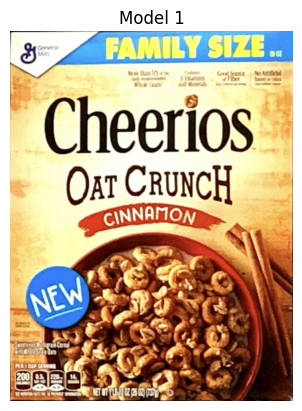

************************************************************************
************************************************************************
Found in the scene 1:
    Position:  (412.237, 538.897)
    Height:  1048.74
    Width:  802.61
************************************************************************
Found in the scene 4:
    Position:  (887.151, 914.052)
    Height:  514.49
    Width:  382.15
************************************************************************
************************************************************************


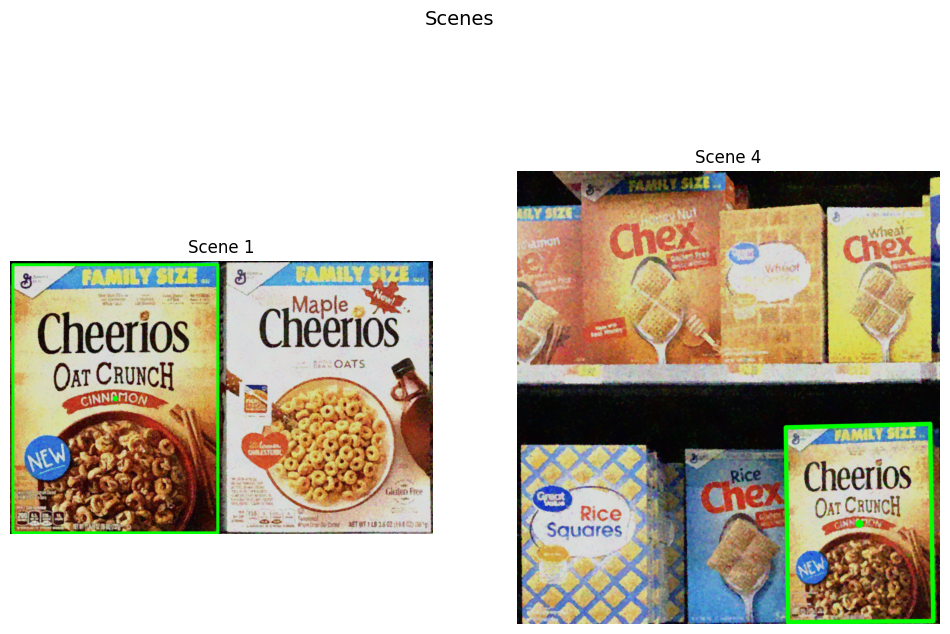

Matched kpts: 15.1 | Matching_coeff: 0.9700000286102295 | Valid Patches: 64 with avg: 0.9405866861343384
###################################################################################################
###################################### Detection of model: 2 ######################################


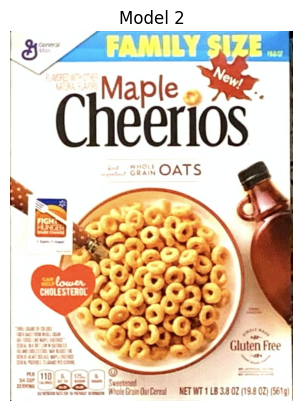

************************************************************************
************************************************************************
In scene 1:
    Position:  (1247.557, 533.451)
    Height:  1048.7347
    Width:  802.6544
************************************************************************
************************************************************************


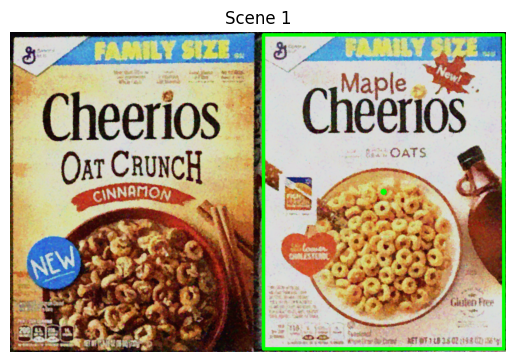

Matched kpts: 13.23 | Matching_coeff: 0.9599999785423279 | Valid Patches: 59 with avg: 0.8202735781669617
###################################################################################################
###################################### Detection of model: 3 ######################################


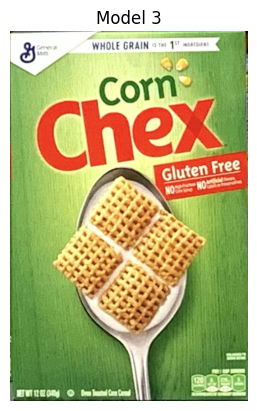

************************************************************************
************************************************************************
In scene 2:
    Position:  (305.572, 493.716)
    Height:  940.94946
    Width:  603.98474
************************************************************************
************************************************************************


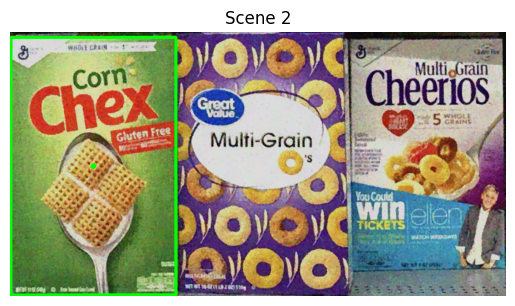

Matched kpts: 7.24 | Matching_coeff: 0.9700000286102295 | Valid Patches: 63 with avg: 0.9377841353416443
###################################################################################################
###################################### Detection of model: 4 ######################################


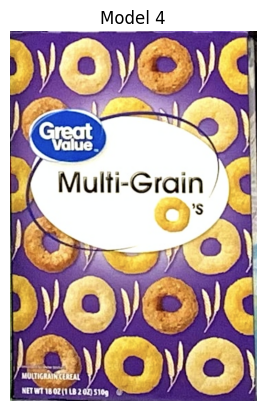

************************************************************************
************************************************************************
In scene 2:
    Position:  (927.667, 482.829)
    Height:  951.10095
    Width:  633.2897
************************************************************************
************************************************************************


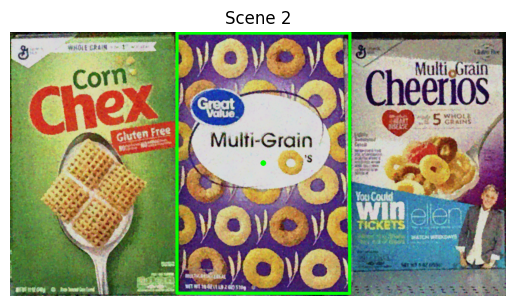

Matched kpts: 10.98 | Matching_coeff: 0.9599999785423279 | Valid Patches: 64 with avg: 0.9246473908424377
###################################################################################################
###################################### Detection of model: 5 ######################################


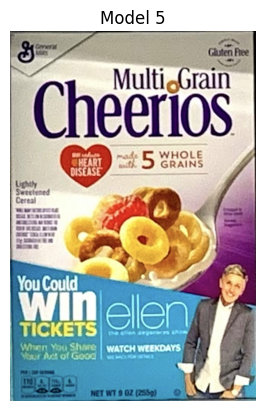

************************************************************************
************************************************************************
In scene 2:
    Position:  (1528.23, 450.151)
    Height:  843.78357
    Width:  560.5764
************************************************************************
************************************************************************


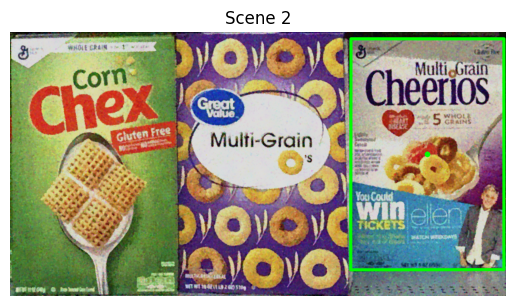

Matched kpts: 6.54 | Matching_coeff: 0.9399999976158142 | Valid Patches: 56 with avg: 0.7502560615539551
###################################################################################################
###################################### Detection of model: 6 ######################################


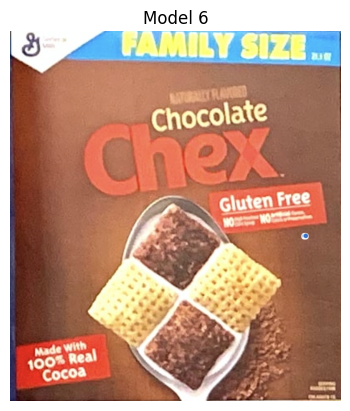

************************************************************************
************************************************************************
In scene 3:
    Position:  (298.418, 457.745)
    Height:  671.7844
    Width:  603.4621
************************************************************************
************************************************************************


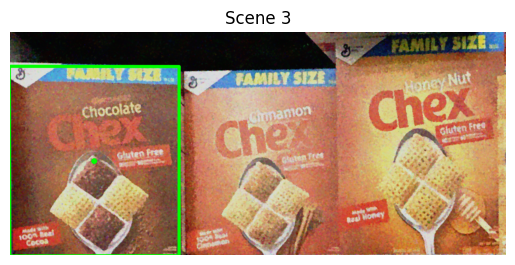

Matched kpts: 6.62 | Matching_coeff: 0.949999988079071 | Valid Patches: 61 with avg: 0.801588773727417
Matched kpts: 1.79 | Matching_coeff: 0.11999999731779099 | Valid Patches: 58 with avg: 0.7991579174995422
###################################################################################################
###################################### Detection of model: 7 ######################################


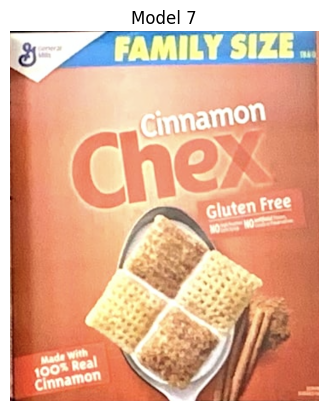

************************************************************************
************************************************************************
Found in the scene 3:
    Position:  (888.575, 460.154)
    Height:  651.07
    Width:  544.16
************************************************************************
Found in the scene 4:
    Position:  (-4.224, 297.541)
    Height:  421.28
    Width:  351.3
************************************************************************
************************************************************************


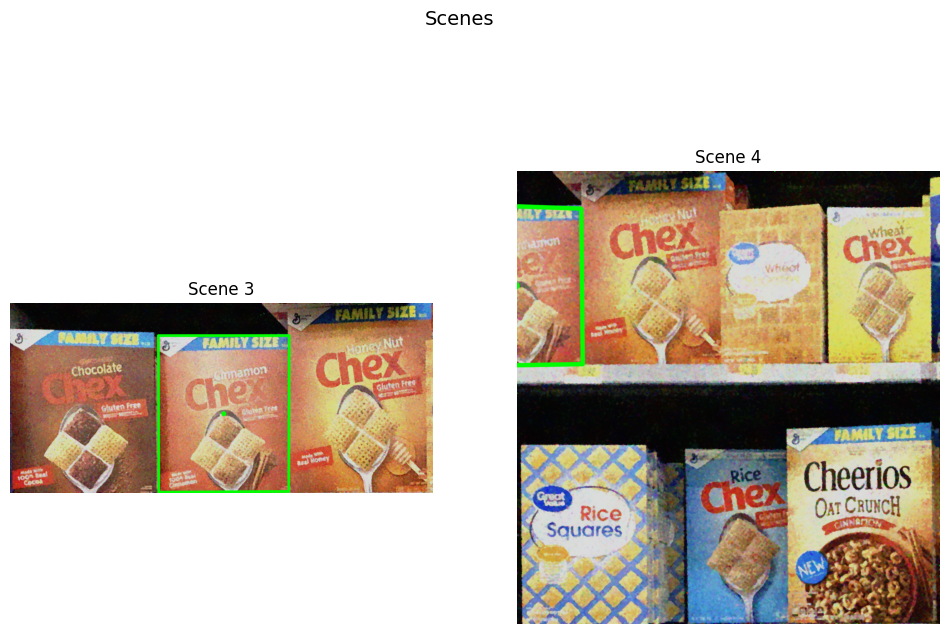

Matched kpts: 7.93 | Matching_coeff: 0.949999988079071 | Valid Patches: 61 with avg: 0.8093320727348328
Matched kpts: 3.28 | Matching_coeff: 0.9300000071525574 | Valid Patches: 59 with avg: 0.7399041056632996
###################################################################################################
###################################### Detection of model: 8 ######################################


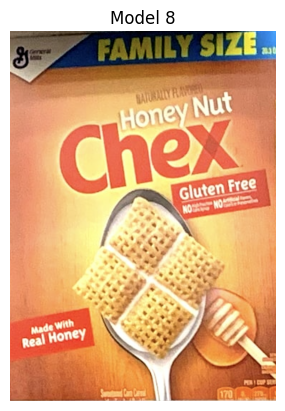

************************************************************************
************************************************************************
Found in the scene 3:
    Position:  (1446.985, 398.398)
    Height:  780.14
    Width:  558.69
************************************************************************
Found in the scene 4:
    Position:  (349.171, 256.968)
    Height:  487.43
    Width:  350.32
************************************************************************
************************************************************************


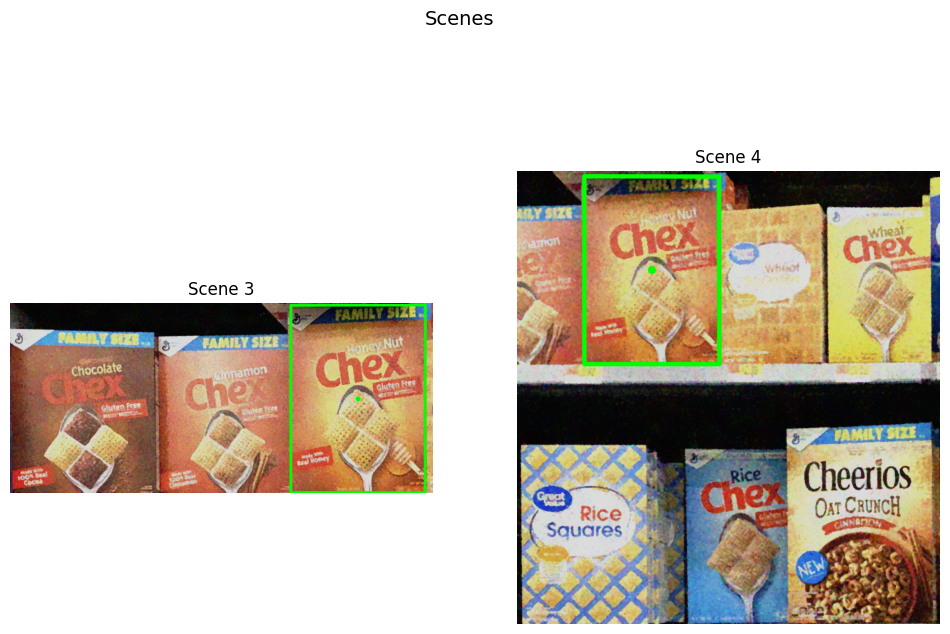

Matched kpts: 1.91 | Matching_coeff: 0.8500000238418579 | Valid Patches: 64 with avg: 0.8350647687911987
###################################################################################################
###################################### Detection of model: 9 ######################################


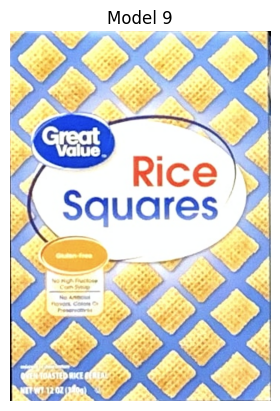

************************************************************************
************************************************************************
In scene 4:
    Position:  (175.796, 942.699)
    Height:  469.88782
    Width:  329.4803
************************************************************************
************************************************************************


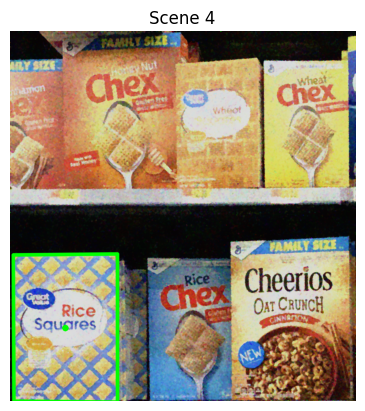

Matched kpts: 2.16 | Matching_coeff: 0.8700000047683716 | Valid Patches: 55 with avg: 0.6770886182785034
###################################################################################################
###################################### Detection of model: 10 ######################################


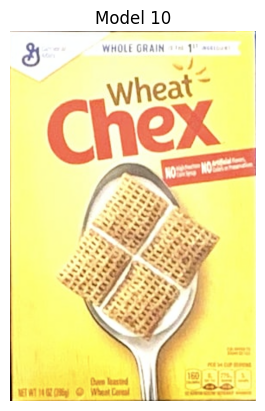

************************************************************************
************************************************************************
In scene 4:
    Position:  (938.785, 294.739)
    Height:  402.7773
    Width:  268.2975
************************************************************************
************************************************************************


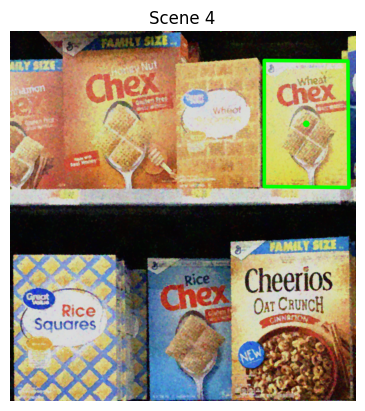

Matched kpts: 9.33 | Matching_coeff: 0.949999988079071 | Valid Patches: 64 with avg: 0.912533700466156
###################################################################################################
###################################### Detection of model: 11 ######################################


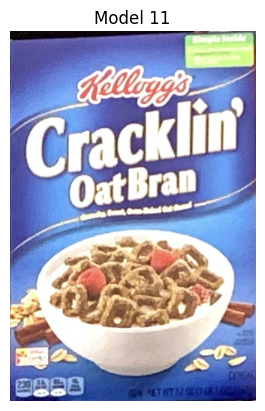

************************************************************************
************************************************************************
In scene 5:
    Position:  (368.596, 751.925)
    Height:  553.74176
    Width:  366.78668
************************************************************************
************************************************************************


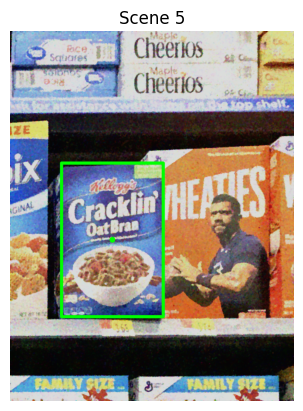

Matched kpts: 14.84 | Matching_coeff: 0.7099999785423279 | Valid Patches: 48 with avg: 0.6763771176338196
###################################################################################################
###################################### Detection of model: 12 ######################################


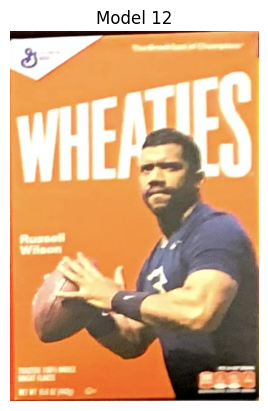

************************************************************************
************************************************************************
In scene 5:
    Position:  (713.696, 739.275)
    Height:  654.3375
    Width:  440.6457
************************************************************************
************************************************************************


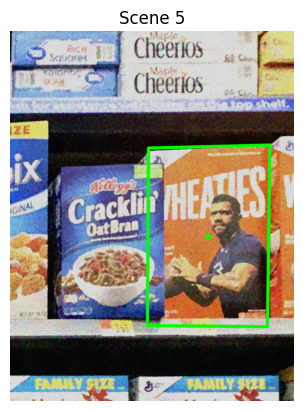

###################################################################################################
###################################### Detection of model: 13 ######################################


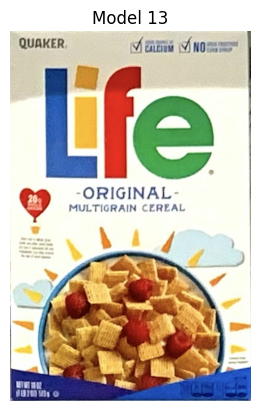

************************************************************************
Model not found!
************************************************************************
###################################################################################################
###################################### Detection of model: 14 ######################################


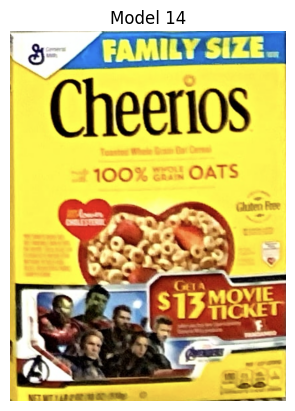

************************************************************************
Model not found!
************************************************************************


In [71]:
scenes_path = 'dataset/denoised_scenes/'
models_path = 'dataset/models/'
scene_name = 'scene'
model_name = 'ref'

models = RGBimages_listing(models_path, model_name, 14)
scenes = RGBimages_listing(scenes_path, scene_name, 12)
models_blurred = [cv2.GaussianBlur(model, (13,13), 2) for model in models]

taskA_models = models[:14]
taskA_scenes = scenes[:5]

for i, model in enumerate(taskA_models):
    scenes_num = []
    boundingboxes = []
    centroids = []
    heights = []
    widths = []
    for j, scene in enumerate(taskA_scenes):
        result =  SIFT_templatematching_occluded_canny(model, scene, 0.015, 0.5, 8, 32)
        if result is not None:
            scenes_num.append(j)
            boundingboxes.append(result[0])
            centroids.append(result[1])
            heights.append(result[2])
            widths.append(result[3])
    plot_result(model, boundingboxes, centroids, heights, widths, i, scenes_num)

## Task B

In [22]:
scenes_path = 'dataset/denoised_scenes/'
models_path = 'dataset/models/'
scene_name = 'scene'
model_name = 'ref'

models = RGBimages_listing(models_path, model_name, 27)
scenes = RGBimages_listing(scenes_path, scene_name, 12)

taskB_models = models[14:]
taskB_scenes = scenes[5:]

In [23]:
def get_homography_B(model_kp, scene_kp, matches):
    src_pts = np.float32([ model_kp[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ scene_kp[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)
    
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 10.0)
    return M, mask

def remove_istance_kp_and_des(scene_kp, scene_des, mask):
    filtered_scene_kp = []
    filtered_scene_des = []
    for i, (kp, des) in enumerate(zip(scene_kp, scene_des)):
        if not mask[i]:
            filtered_scene_kp.append(kp)
            filtered_scene_des.append(des)
    return np.float32(filtered_scene_kp), np.float32(filtered_scene_des)

In [24]:
def get_transformed_corners(model, M):
    # Handle both: grey scale and colored images
    if len(model.shape) == 3:
        h,w, _ = model.shape
    else: 
        h,w = model.shape
    
    model_corners = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    trans_corners = cv2.perspectiveTransform(model_corners,M)
    return trans_corners

def draw_bounding_box_B(model, scene, M):
    trans_corners = get_transformed_corners(model, M)
    
    scene_with_bounding_box = cv2.polylines(scene,[np.int32(trans_corners)],True,(0, 255, 0),10, cv2.LINE_AA)
    
    # Height and Width of boundinx_box
    min_x = np.min(trans_corners[:, :, 0])
    max_x = np.max(trans_corners[:, :, 0])
    min_y = np.min(trans_corners[:, :, 1])
    max_y = np.max(trans_corners[:, :, 1])
    height = max_y - min_y
    width = max_x - min_x
    
    # Centroid
    centroid_position = centroid_of_polygon(trans_corners.reshape(-1, 2))
    cv2.circle(scene_with_bounding_box, tuple(map(int, centroid_position)), radius=5, color=(0,255,0), thickness=10)
    
    return scene_with_bounding_box, centroid_position, height, width, trans_corners

In [25]:
def point_in_parallelogram(point, parallelogram):
    """
    Check if a point is within a parallelogram.

    Parameters:
        point: tuple, representing the (x, y) coordinates of the point.
        parallelogram: list of tuples, representing the (x, y) coordinates of the vertices of the parallelogram.

    Returns:
        bool: True if the point is within the parallelogram, False otherwise.
    """
    def sign(p1, p2, p3):
        return (p1[0] - p3[0]) * (p2[1] - p3[1]) - (p2[0] - p3[0]) * (p1[1] - p3[1])

    b1 = sign(point, parallelogram[0][0], parallelogram[1][0]) < 0.0
    b2 = sign(point, parallelogram[1][0], parallelogram[2][0]) < 0.0
    b3 = sign(point, parallelogram[2][0], parallelogram[3][0]) < 0.0
    b4 = sign(point, parallelogram[3][0], parallelogram[0][0]) < 0.0

    return ((b1 == b2) and (b2 == b3) and (b3 == b4))

def point_inside_polygon(x, y, polygon):
    """
    Check if a point (x, y) is inside a polygon.

    Parameters:
        x: float, x-coordinate of the point.
        y: float, y-coordinate of the point.
        polygon: list of tuples, representing the vertices of the polygon.

    Returns:
        bool: True if the point is inside the polygon, False otherwise.
    """
    n = len(polygon)
    inside = False
    p1x, p1y = polygon[0]
    for i in range(n + 1):
        p2x, p2y = polygon[i % n]
        if y > min(p1y, p2y):
            if y <= max(p1y, p2y):
                if x <= max(p1x, p2x):
                    if p1y != p2y:
                        xinters = (y - p1y) * (p2x - p1x) / (p2y - p1y) + p1x
                    if p1x == p2x or x <= xinters:
                        inside = not inside
        p1x, p1y = p2x, p2y
    return inside

def removeBoundedKP(scene_des, scene_kp, corners):
    coords = [kp.pt for kp in scene_kp]
    filtered_scene_des = []
    filtered_scene_kp = []
    
    kp_to_be_deleted = []
    for idx, coord in enumerate(coords):
        if not point_in_parallelogram(coord, corners):
            filtered_scene_des.append(scene_des[idx])
            filtered_scene_kp.append(scene_kp[idx])
        else:
            kp_to_be_deleted.append(coord)
    clipped = len(scene_kp) - len(filtered_scene_kp)
    print(f"We have removed {clipped} descriptors out of {len(scene_kp)}!")
    
    return np.array(filtered_scene_des), np.array(filtered_scene_kp), kp_to_be_deleted


In [26]:
def blurratore(img, kernel_size, sigma):
    img_blurred = img
    for i in range(100):
        img_blurred = cv2.GaussianBlur(img_blurred, kernel_size, sigma)
    return img_blurred

In [27]:
def doublecheck_SIFT(model, roi):
    sift = cv2.SIFT_create()
    model_KP, model_des = sift.detectAndCompute(model, None)
    roi_kp, roi_des = sift.detectAndCompute(roi, None)
    
    matches = flann_knn_standard(model_des, roi_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    return filtered_matches

def doublecheck_SIFT_HSV(model, roi):
    sift = cv2.SIFT_create()
    model_KP, model_des = sift.detectAndCompute(cv2.cvtColor(model, cv2.COLOR_RGB2HSV), None)
    roi_kp, roi_des = sift.detectAndCompute(cv2.cvtColor(roi, cv2.COLOR_RGB2HSV), None)
    
    matches = flann_knn_standard(model_des, roi_des)
    filtered_matches = ambiguous_matches_filter(matches)
    
    return filtered_matches

def doublecheck_template_matching(model, roi, func):
    return round(cv2.matchTemplate(model, roi, func)[0][0],3)

def doublecheck_template_matching(model, roi, func):
    return round(cv2.matchTemplate(model, roi, func)[0][0],3)

def doublecheck_template_matching_HSV(model, roi, func):
    hsv_model = cv2.cvtColor(model, cv2.COLOR_BGR2HSV)
    h_model, _, _ = cv2.split(hsv_model)
    
    hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    h_roi, _, _ = cv2.split(hsv_roi)
    return round(cv2.matchTemplate(h_model, h_roi, func)[0][0],3)

def doublecheck_hist_colors(model, roi):
    hist_model = cv2.calcHist([model], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist_roi = cv2.calcHist([roi], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    
    similarity = cv2.compareHist(hist_model, hist_roi, cv2.HISTCMP_BHATTACHARYYA)
    
    return round(similarity,3)

In [28]:
def increase_contrast(img, clipLimit):
    ycrcb_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=(8,8))
    ycrcb_img[:, :, 0] = clahe.apply(ycrcb_img[:, :, 0])
    filtered_img = cv2.cvtColor(ycrcb_img, cv2.COLOR_YCrCb2BGR)
    #filtered_img = cv2.fastNlMeansDenoisingColored(filtered_img)
    return filtered_img

In [29]:
def brute_force_matching_KNN(model_des, scene_des):
    BFMatcher = cv2.BFMatcher(normType = cv2.NORM_HAMMING, crossCheck = True)
    matches = BFMatcher.match(model_des, scene_des)
    return matches
def pixel_average(img):
    b, g, r = cv2.split(img)
    b_val = np.mean(b)
    g_val = np.mean(g)
    r_val = np.mean(r)
    return  round(np.mean([r_val, g_val, b_val]),3)

In [41]:
def objects_detection(algorithm, model, scene, th, temp_th = None, func = cv2.TM_SQDIFF_NORMED):
    algorithms = {
        'sift': {
            'detector': cv2.SIFT_create(),
            'matcher': flann_knn_standard,
            'filter' : ambiguous_matches_filter
                 },
        'brisk': {
            'detector': cv2.BRISK_create(),
            'matcher': brute_force_matching_KNN
                },
        'orb': {
            'detector': cv2.ORB_create(),
            'matcher': brute_force_matching_KNN
                }
    }
    
    model_kp, model_des = algorithms[algorithm]['detector'].detectAndCompute(model, None)
    scene_kp, scene_des = algorithms[algorithm]['detector'].detectAndCompute(scene, None)
    
    print('Num of model kp: ', len(model_kp))
    print('Model pixel average: ', pixel_average(model))
    num_ist = 0
    more_instances = True
    filtered_scene_des = scene_des
    filtered_scene_kp = scene_kp
    boundingboxscene = scene.copy()
    kp_to_be_deleted = []
    doublecheck_SIFTs = []
    doublecheck_templatematch = []
    pix_average = []
    hist_colors = []
    
    while more_instances:
        
        matches = algorithms[algorithm]['matcher'](model_des, filtered_scene_des)
        if 'filter' in algorithms[algorithm]:
            matches = algorithms[algorithm]['filter'](matches)
        
        print('Number of matches: ', len(matches))
        
        if len(matches) > 4 and is_detected(len(model_kp), len(matches), th) and (num_ist == 0 or len(kp_to_be_deleted) != 0):
            print(f'######################## Iteration {num_ist} ########################')
            num_ist += 1
            
            M, _ = get_homography_B(model_kp, filtered_scene_kp, matches)
            corners = get_transformed_corners(model, M)
            
        
            roi = get_ROI_perspective_warped(model, scene, M)
            #plt.imshow(roi)
            #plt.show()
            roi_filtered = cv2.bilateralFilter(cv2.medianBlur(cv2.medianBlur(roi, 7), 7), d=20, sigmaColor=10, sigmaSpace=10)
            
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            axes[0].imshow(roi)
            axes[0].set_title('Roi')
            axes[0].axis('off')
            axes[1].imshow(roi_filtered)            
            axes[1].set_title('Roi Filtered')
            axes[1].axis('off')
            plt.show()
            # If there is the template matching threshold then we use it to check
            if temp_th is not None:
                 if temp_th > doublecheck_template_matching(model, roi_filtered, func):
                    boundingboxscene, _, _, _ = draw_bounding_box(model, boundingboxscene, M)
            else:
                boundingboxscene, _, _, _ = draw_bounding_box(model, boundingboxscene, M)
                
            #doublecheck_SIFTs.append(round(len(doublecheck_SIFT_HSV(model, roi))*100/len(model_kp), 3))
            doublecheck_templatematch.append(doublecheck_template_matching(model, roi_filtered, func))
            pix_average.append(pixel_average(roi))
            hist_colors.append(doublecheck_hist_colors(model, roi))
            
            filtered_scene_des, filtered_scene_kp, kp_to_be_deleted = removeBoundedKP(filtered_scene_des, filtered_scene_kp, corners)
        else:
            more_instances = False
        
    print('List of SIFT %: ', [float(x) for x in doublecheck_SIFTs])
    print('List of template matching score with SSD Norm ', [float(x) for x in doublecheck_templatematch])
    print('List of averages of pixels: ', [float(x) for x in pix_average])
    print('List of similarities of colors: ', [float(x) for x in hist_colors])
    
    return boundingboxscene
    

In [50]:
def objects_detection_HSV(algorithm, model, scene, th, temp_th = None, func = cv2.TM_SQDIFF_NORMED):
    algorithms = {
        'sift': {
            'detector': cv2.SIFT_create(),
            'matcher': flann_knn_standard,
            'filter' : ambiguous_matches_filter
                 },
        'brisk': {
            'detector': cv2.BRISK_create(),
            'matcher': brute_force_matching_KNN
                },
        'orb': {
            'detector': cv2.ORB_create(),
            'matcher': brute_force_matching_KNN
                }
    }
    
    model_kp, model_des = algorithms[algorithm]['detector'].detectAndCompute(model, None)
    scene_kp, scene_des = algorithms[algorithm]['detector'].detectAndCompute(scene, None)
    
    print('Num of model kp: ', len(model_kp))
    print('Model pixel average: ', pixel_average(model))
    num_ist = 0
    more_instances = True
    filtered_scene_des = scene_des
    filtered_scene_kp = scene_kp
    boundingboxscene = scene.copy()
    kp_to_be_deleted = []
    doublecheck_SIFTs = []
    doublecheck_templatematch = []
    pix_average = []
    hist_colors = []
    
    while more_instances:
        
        matches = algorithms[algorithm]['matcher'](model_des, filtered_scene_des)
        if 'filter' in algorithms[algorithm]:
            matches = algorithms[algorithm]['filter'](matches)
        
        print('Number of matches: ', len(matches))
        
        if len(matches) > 4 and is_detected(len(model_kp), len(matches), th) and (num_ist == 0 or len(kp_to_be_deleted) != 0):
            print(f'######################## Iteration {num_ist} ########################')
            num_ist += 1
            
            M, _ = get_homography_B(model_kp, filtered_scene_kp, matches)
            corners = get_transformed_corners(model, M)
            
        
            roi = get_ROI_perspective_warped(model, scene, M)
            #plt.imshow(roi)
            #plt.show()
            
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            axes[0].imshow(roi)
            axes[0].set_title('Roi')
            axes[0].axis('off')
            axes[1].imshow(roi)            
            axes[1].set_title('Roi Filtered')
            axes[1].axis('off')
            plt.show()
            # If there is the template matching threshold then we use it to check
            if temp_th is not None:
                 if temp_th > doublecheck_template_matching_HSV(model, roi, func):
                    boundingboxscene, _, _, _ = draw_bounding_box(model, boundingboxscene, M)
            else:
                boundingboxscene, _, _, _ = draw_bounding_box(model, boundingboxscene, M)
                
            #doublecheck_SIFTs.append(round(len(doublecheck_SIFT_HSV(model, roi))*100/len(model_kp), 3))
            doublecheck_templatematch.append(doublecheck_template_matching_HSV(model, roi, func))
            pix_average.append(pixel_average(roi))
            hist_colors.append(doublecheck_hist_colors(model, roi))
            
            filtered_scene_des, filtered_scene_kp, kp_to_be_deleted = removeBoundedKP(filtered_scene_des, filtered_scene_kp, corners)
        else:
            more_instances = False
        
    print('List of SIFT %: ', [float(x) for x in doublecheck_SIFTs])
    print('List of template matching score with SSD Norm ', [float(x) for x in doublecheck_templatematch])
    print('List of averages of pixels: ', [float(x) for x in pix_average])
    print('List of similarities of colors: ', [float(x) for x in hist_colors])
    
    return boundingboxscene
    

## Good image for detection: 
- medianBlur(9) + bilateral (80, 20, 90) --> it detects the darkest and the lightest; also 80 20 100
- medianBlur(9) + bilateral (80, 30, 120) --> it detects the darkest and the medium.

kp: 1291


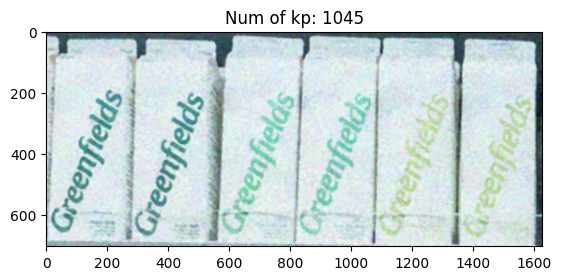

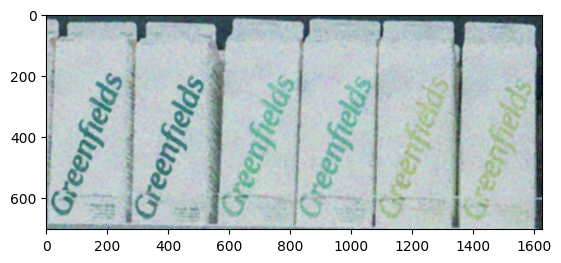

In [43]:
scene = cv2.cvtColor(cv2.imread('dataset/scenes/scene12.png'), cv2.COLOR_BGR2RGB)
scene = cv2.cvtColor(cv2.imread('dataset/scenes/scene12.png'), cv2.COLOR_BGR2RGB)
scene_good = cv2.medianBlur(scene, 9)
scene_good = cv2.bilateralFilter(scene_good, d=77, sigmaColor=20, sigmaSpace=90)
laplacian = cv2.Laplacian(scene_good, cv2.CV_64F)
laplacian = cv2.normalize(scene_good, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
#laplacian = cv2.convertScaleAbs(laplacian)

sift = cv2.SIFT_create()
kp, _ = sift.detectAndCompute(laplacian, None)
print('kp:', len(kp))
plt.imshow(laplacian)
plt.title('Num of kp: 1045')
plt.show()

plt.imshow(scene_good)
plt.show()

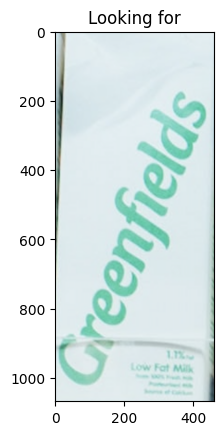

Num of model kp:  165
Model pixel average:  219.31
Number of matches:  165
######################## Iteration 0 ########################


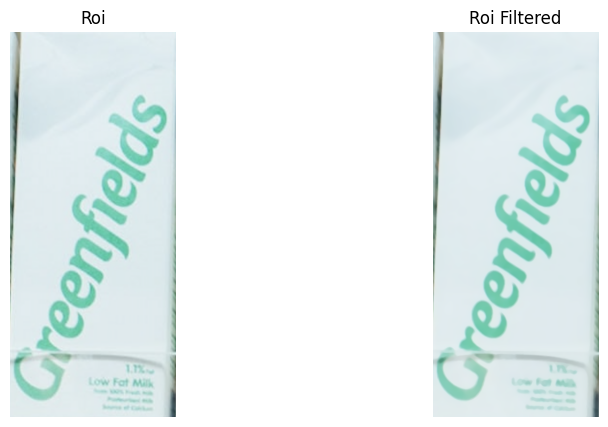

We have removed 165 descriptors out of 165!


error: OpenCV(4.10.0) /Users/runner/work/opencv-python/opencv-python/opencv/modules/flann/src/miniflann.cpp:336: error: (-210:Unsupported format or combination of formats) in function 'buildIndex_'
> type=0
> 

In [57]:
light = cv2.cvtColor(cv2.imread('dataset/models/ref18.png'), cv2.COLOR_BGR2RGB) 
medium = cv2.cvtColor(cv2.imread('dataset/models/ref27.png'), cv2.COLOR_BGR2RGB) 
dark = cv2.cvtColor(cv2.imread('dataset/models/ref26.png'), cv2.COLOR_BGR2RGB) 
scene = cv2.cvtColor(cv2.imread('dataset/scenes/scene12.png'), cv2.COLOR_BGR2RGB)

chosen = medium
plt.imshow(chosen)
plt.title('Looking for')
plt.show()

found = objects_detection('sift', model, chosen, 0.02, 0.25)


plt.imshow(found)
plt.show()

#filtered_img = cv2.bilateralFilter(removed_impulse_img, d=35, sigmaColor=30, sigmaSpace=50)


In [32]:
model = cv2.imread('dataset/models/ref26.png')
rgb_model = cv2.cvtColor(model, cv2.COLOR_BGR2RGB)
hsv_model = cv2.cvtColor(model, cv2.COLOR_BGR2HSV)
gray_model = cv2.cvtColor(model, cv2.COLOR_BGR2GRAY)

sift = cv2.SIFT_create()
model_kp_rgb, model_des_rgb = sift.detectAndCompute(rgb_model, None)
model_kp_hsv, model_des_hsv = sift.detectAndCompute(hsv_model, None)
model_kp_gray, model_des_gray = sift.detectAndCompute(gray_model, None)
print('Len model_kp_rgb:', len(model_kp_rgb))
print('Len model_kp_hsv:', len(model_kp_hsv))
print('Len model_kp_rgb:', len(model_kp_gray))


Len model_kp_rgb: 346
Len model_kp_hsv: 86
Len model_kp_rgb: 299


(1068, 460, 3)
(1068, 420, 3)


# THIS CODE BELOW TO BE DELETED BEFORE SUBMISSION

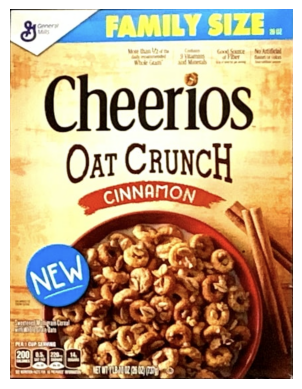

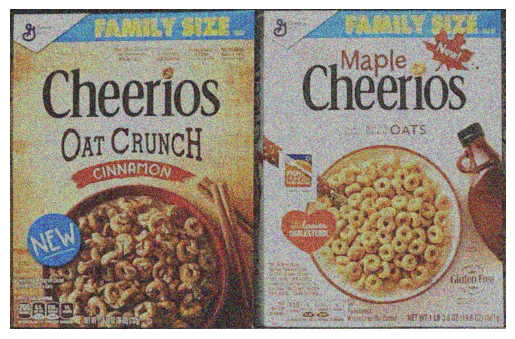

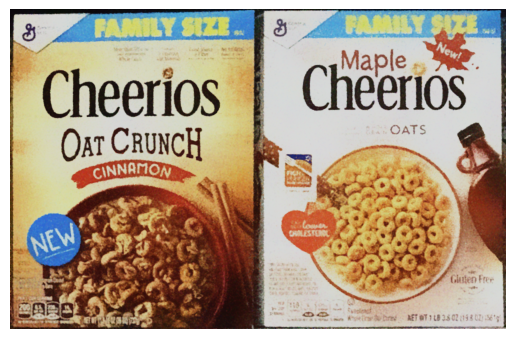

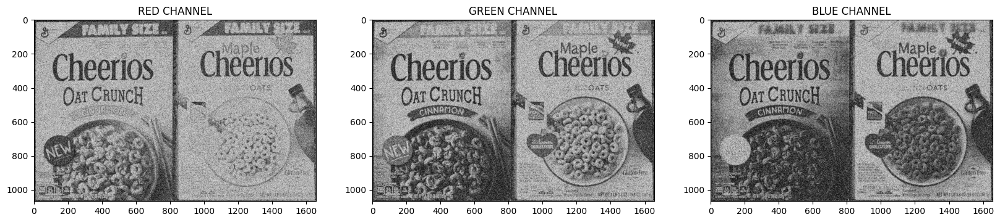

In [ ]:

# Could be usefull
def find_origin_offset(homography_matrix):
    # Find the inverse of the homography matrix
    inverse_homography_matrix = np.linalg.inv(homography_matrix)

    # Define the origin point (0,0)
    origin_point = np.array([[0, 0]], dtype=np.float32)

    # Apply perspective transformation to the origin point using the inverse homography matrix
    mapped_origin = cv2.perspectiveTransform(origin_point.reshape(-1, 1, 2), inverse_homography_matrix)

    # Extract the x and y coordinates of the mapped origin
    x_offset = mapped_origin[0, 0, 0]
    y_offset = mapped_origin[0, 0, 1]

    return x_offset, y_offset

def apply_offset_to_homography(homography_matrix):
    x_offset, y_offset = find_origin_offset(homography_matrix)
    # Define the translational homography matrix
    offset_matrix = np.array([[1, 0, x_offset],
                              [0, 1, y_offset],
                              [0, 0, 1]])

    # Perform matrix multiplication to apply the offset
    new_homography_matrix = np.dot(offset_matrix, homography_matrix)

    return new_homography_matrix

def zncc(image1, image2):
    # Convert images to float32
    image1 = image1.astype(np.float32)
    image2 = image2.astype(np.float32)
    
    # Compute mean of each image
    mean1 = np.mean(image1)
    mean2 = np.mean(image2)
    
    # Compute zero-mean images
    zero_mean_image1 = image1 - mean1
    zero_mean_image2 = image2 - mean2
    
    # Compute cross-correlation
    cross_corr = np.sum(zero_mean_image1 * zero_mean_image2)
    
    # Compute standard deviations
    std1 = np.sqrt(np.sum(zero_mean_image1 ** 2))
    std2 = np.sqrt(np.sum(zero_mean_image2 ** 2))
    
    # Compute ZNCC
    zncc_value = cross_corr / (std1 * std2)
    
    return zncc_value



def RGBimages_listing_from_to(dir_path, img_name, fr, to):
    '''
    Usefull function for testing. Must be deletet before submission.
    '''
    imgs = []
    img_names = [f"{img_name}{i}.png" for i in range(fr,to+1)]
    
    for img_name in img_names:
        img = cv2.imread(dir_path+img_name)
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imgs.append(rgb_img)
    return imgs
# Load a reference image
img = cv2.imread("dataset/models/ref1.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Load a scene
scene = cv2.imread("dataset/scenes/scene1.png")
scene = cv2.cvtColor(scene, cv2.COLOR_BGR2RGB)

# Print
plt.imshow(img)
plt.axis('off')
plt.show()
plt.imshow(scene)
plt.axis('off')
plt.show()

filter_scene = scene.copy()

# Use a median filter to remove impulse noise
# Define the size of the impulse kernel (e.g., 3x3)
kernel_size = 10

# # Create an impulse kernel
# impulse_kernel = np.zeros((kernel_size, kernel_size), dtype=np.uint8)
# center = (kernel_size - 1) // 2
# impulse_kernel[center, center] = 1
# filter_scene = cv2.filter2D(filter_scene, -1, impulse_kernel)

# Create a median filter
filter_scene = cv2.medianBlur(filter_scene, 5)

# Follow by linear filtering to remove guassian noise

# A simple mean filter
k_size = 9
mean_kernel = np.ones([k_size, k_size])/(k_size**2)
# filter_scene = cv2.filter2D(filter_scene, -1, mean_kernel)

# An API Guassian filter
# filter_scene = cv2.GaussianBlur(filter_scene, (9, 9), 5)

# Bilaterial filter
filter_scene = cv2.bilateralFilter(filter_scene, d=100, sigmaColor=75, sigmaSpace=75)

# IDEA: THERE IS MORE NOISE IN SOME R, G, B CHANNELS THAN OTHERS?

plt.imshow(filter_scene)
plt.axis('off')
plt.show()

# Print the seperate R,G,B channels
R = scene[:,:,0] # Getting the first axis (R)
G = scene[:,:,1] # Getting the second axis (G)
B = scene[:,:,2] # Getting the third axis (B)

plt.figure(figsize = (20, 10))

plt.subplot(1,3,1)
plt.imshow(R, cmap = 'gray', vmin = 0, vmax = 255)
plt.title('RED CHANNEL')

plt.subplot(1,3,2)
plt.imshow(G, cmap = 'gray', vmin = 0, vmax = 255)
plt.title("GREEN CHANNEL")

plt.subplot(1,3,3)
plt.imshow(B, cmap = 'gray', vmin = 0, vmax = 255)
plt.title("BLUE CHANNEL")

plt.show()